<a href="https://colab.research.google.com/github/Sushmitha-Katti/Artshaala--Frontend/blob/master/Copy_of_Modest(SSIM%2CBCE).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Check GPU type

In [0]:
!nvidia-smi


Mon May 25 15:36:49 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

## Mount Colab

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


## Extract

In [0]:
#Extract data
import time
import os
import zipfile
"""
Extract Data from Google drive
"""
def extract_data(no_of_set = 1):
    if(no_of_set > 6 or no_of_set < 1):
      print('No of sets should be not be less that 1 and greater that 6')
      return
    for i in range(1,no_of_set+1):
      start = time.time()
      if (os.path.isdir("data_"+str(i))):
          print (f'Imagesof set {i} already downloaded...')
      else:
        
        archive = zipfile.ZipFile(f'/content/gdrive/My Drive/Mask_Rcnn/Dataset/data_part{str(i)}.zip')
        archive.extractall()
      end = time.time()
    print(f"data set extraction took {round(end-start,2)}s")

In [0]:
extract_data(no_of_set=5)

data set extraction took 63.5s


## Clone Pynet

In [0]:
!git clone "https://github.com/Sushmitha-Katti/PyTNet"

Cloning into 'PyTNet'...
remote: Enumerating objects: 125, done.
remote: Counting objects: 100% (125/125), done.
remote: Compressing objects: 100% (89/89), done.
remote: Total 125 (delta 67), reused 84 (delta 33), pack-reused 0
Receiving objects: 100% (125/125), 35.00 KiB | 4.37 MiB/s, done.
Resolving deltas: 100% (67/67), done.


## Albumentation installation

In [0]:
! pip install torchgeometry > /dev/null && echo "Torchgeometry library is successfully installed!"

Torchgeometry library is successfully installed!


In [0]:
!pip install --no-cache-dir git+https://github.com/albu/albumentations > /dev/null && echo "Albumentation library is successfully installed!"

  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-oom966v9
Albumentation library is successfully installed!


In [0]:
import sys
sys.path.append("PyTNet")

## Import Statement

In [0]:
import torch
import train_test_loader
from Models.MaskDepthModel import UNet
import evaluate
from Albumentationtransform import AlbumentationTransforms

## Model Summary

In [0]:
from torchsummary import summary
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
model = UNet(n_channels = 6,n_classes = 1).to(device)
summary(model, input_size=(6, 64, 64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 64, 64]           1,760
       BatchNorm2d-2           [-1, 32, 64, 64]              64
              ReLU-3           [-1, 32, 64, 64]               0
            Conv2d-4           [-1, 32, 64, 64]           9,248
       BatchNorm2d-5           [-1, 32, 64, 64]              64
              ReLU-6           [-1, 32, 64, 64]               0
        DoubleConv-7           [-1, 32, 64, 64]               0
         MaxPool2d-8           [-1, 32, 32, 32]               0
            Conv2d-9           [-1, 32, 32, 32]           9,248
      BatchNorm2d-10           [-1, 32, 32, 32]              64
             ReLU-11           [-1, 32, 32, 32]               0
           Conv2d-12           [-1, 32, 32, 32]           9,248
      BatchNorm2d-13           [-1, 32, 32, 32]              64
             ReLU-14           [-1, 32,

## Dataset

In [0]:
from Dataset.MaskDepth import RawDataSet

## Dataloader and Albumentation

In [0]:
import albumentations as A
import cv2
import time
fg_bg_means = (0.65830478, 0.61511271, 0.5740604,0.65830478, 0.61511271, 0.5740604)
fg_bg_stdevs = (0.24408717, 0.2542491, 0.26870159,0.24408717, 0.2542491, 0.26870159)
op_means = (0)
op_std = (255)

train_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                   
                                       ])
op_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=op_means, std=op_std),
                                      A.Transpose(always_apply=True),
                                
                                   
                                       ])

test_transform = AlbumentationTransforms([
                                          A.Resize(64,64),
                                          A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                        ])
train  = {
    'ip': train_transform,
    'op': op_transform
}
test = {
    'ip': test_transform,
    'op': op_transform
}
start = time.time()
train_dataset , test_dataset= RawDataSet(train_split = 70,test_transforms=test,train_transforms=train, whole_data = True)
end = time.time()
print(f'dataset formation took {round(end-start,3)} seconds')


400000
dataset formation took 1.186 seconds


In [0]:
trainloader, testloader = train_test_loader.load(train_dataset,test_dataset,batch_size=128)

In [0]:
import torchvision
from torch.utils.tensorboard import SummaryWriter
tb = SummaryWriter('runs/MODEST')
images, mask, depth = next(iter(trainloader))
images = images.to(device)

#tb.add_image('images', images)
tb.add_graph(model, images)
tb.close()

In [0]:
import os
logs_base_dir = "runs/MODEST"
os.makedirs(logs_base_dir, exist_ok=True)

In [0]:
%reload_ext tensorboard
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

# Sample Inputs

sample train images took 2.246s to dispay


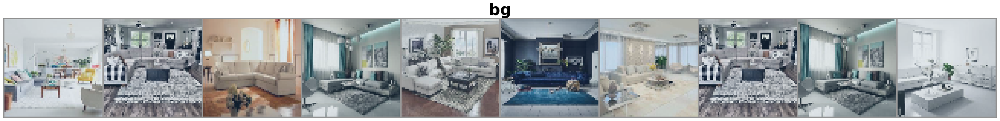

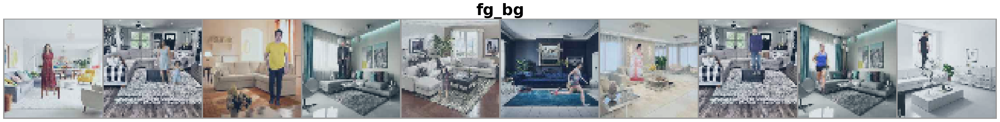

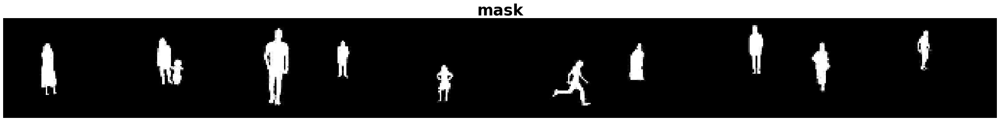

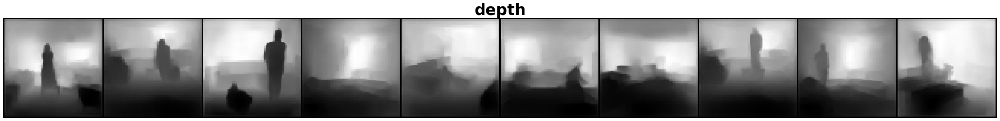

In [0]:
from show_images import show_sample_data
show_sample_data(trainloader)

# Model Training

In [0]:
import torch
from torch.autograd import Function


class DiceCoeff(Function):
    """Dice coeff for individual examples"""

    def forward(self, input, target):
        self.save_for_backward(input, target)
        eps = 0.0001
        self.inter = torch.dot(input.view(-1), target.view(-1))
        self.union = torch.sum(input) + torch.sum(target) + eps

        t = (2 * self.inter.float() + eps) / self.union.float()
        return t

    # This function has only a single output, so it gets only one gradient
    def backward(self, grad_output):

        input, target = self.saved_variables
        grad_input = grad_target = None

        if self.needs_input_grad[0]:
            grad_input = grad_output * 2 * (target * self.union - self.inter) \
                         / (self.union * self.union)
        if self.needs_input_grad[1]:
            grad_target = None

        return grad_input, grad_target


def dice_coefficient(pred, target, mask=False):
    """Dice coeff for batches"""
    pred = torch.sigmoid(pred)
    s = torch.FloatTensor(1).cuda().zero_()

    for i, c in enumerate(zip(pred, target)):
        s = s + DiceCoeff().forward(c[0], c[1])

    return s 

In [0]:
# -*- coding: utf-8 -*-
"""train_test.py

train_test for mask and depth

"""


import dill as dill
import torch
import time
from evaluation_metrics.accuracy import dice_coefficient

#Training & Testing Loops
from tqdm.notebook import tqdm
from tqdm import tqdm_notebook

train_losses = []
test_losses = []
train_acc = []
test_acc = []
running_mask_loss=0.0
running_depth_loss=0.0

# Training

def train(model, device, train_loader, optimizer, mask_criterion, depth_criterion, epoch,scheduler = False):
  running_mask_loss = 0.0
  running_depth_loss=0.0
  model.train()
  mask_coef = 0
  depth_coef = 0
  pbar = tqdm(train_loader)
  total_length = len(train_loader)
  for batch_idx, (data, mask_target, depth_target) in enumerate(pbar):
    # get samples
    data, mask_target, depth_target = data.to(device), mask_target.to(device), depth_target.to(device)


    optimizer.zero_grad()
    # In PyTorch, we need to set the gradients to zero before starting to do backpropragation because PyTorch accumulates the gradients on subsequent backward passes. 
    # Because of this, when you start your training loop, ideally you should zero out the gradients so that you do the parameter update correctly.

    # Predict
    mask_target = mask_target.unsqueeze_(1)
    depth_target = depth_target.unsqueeze_(1)
    mask_pred, depth_pred = model(data)

    # Calculate loss
    
    mask_loss = mask_criterion(  mask_pred, mask_target)
    depth_loss = depth_criterion(depth_target,depth_pred)
    loss = mask_loss+ depth_loss
    mask_coef += dice_coefficient(mask_pred,mask_target, mask= True).item()
    depth_coef += dice_coefficient(depth_pred, depth_target, mask=False).item()
    # Backpropagation
    torch.autograd.backward([mask_loss, depth_loss])

    optimizer.step()
    if(scheduler):
      scheduler.step()

    pbar.set_description(f'Loss={loss:0.4f}')
  print('\nTrain set: Average loss: {:.4f}, Coef: ({:.5f})\n'.format((mask_loss+depth_loss)/2,  (mask_coef+depth_coef) /(2*total_length)))
  train_losses.append((mask_loss/total_length,depth_loss/total_length))
  train_acc.append((mask_coef/total_length, depth_coef/total_length))
#   tb.add_scalar('Mask Train Loss', mask_loss/total_length, epoch)
#   tb.add_scalar('Depth Train Loss', depth_loss/total_length, epoch)
#   tb.add_scalar('Total Train Loss', (mask_loss+depth_loss)/(2*total_length), epoch)
#   tb.add_scalar('Mask Train Coef',mask_coef/total_length, epoch)
#   tb.add_scalar('Depth Train Coef', depth_coef/total_length, epoch)
#   tb.add_scalar('Total Train Coef', (mask_coef+depth_coef)/(2*total_length), epoch)
  return train_losses, train_acc
  



# Testing
def test(model, device, mask_criterion, depth_criterion, test_loader, epoch):
    model.eval()
    mask_loss = 0
    depth_loss = 0
    correct = 0
    mask_coef = 0
    depth_coef = 0
    total_length = len(test_loader)
    with torch.no_grad():
        for data, mask_target, depth_target in tqdm(test_loader):
            data, mask_target, depth_target = data.to(device), mask_target.to(device), depth_target.to(device)
            mask_target = mask_target.unsqueeze_(1)
            depth_target = depth_target.unsqueeze_(1)
            mask_pred, depth_pred = model(data)
            mask_loss += mask_criterion(mask_pred,mask_target).item()  # sum up batch loss
            depth_loss += depth_criterion(depth_target,depth_pred).item()
            test_loss = mask_loss+depth_loss
          
            mask_coef += dice_coefficient(mask_pred,mask_target, mask= True).item()
            depth_coef += dice_coefficient(depth_pred, depth_target, mask=False).item()
            
    # print(test_loss)
    test_loss /= (2*total_length)
    test_losses.append((mask_loss/total_length, depth_loss/total_length,test_loss))

    print('\nTest set: Average loss: {:.4f}, Coef: ({:.5f})\n'.format(
        test_loss, 
         (mask_coef+depth_coef) /(2*total_length)))
    
    test_acc.append((mask_coef/total_length,depth_coef/total_length))
    # tb.add_scalar('Mask Test Loss', mask_loss/total_length, epoch)
    # tb.add_scalar('Depth Test Loss', depth_loss/total_length, epoch)
    # tb.add_scalar('Total Test Loss', (mask_loss+depth_loss)/(2*total_length), epoch)
    # tb.add_scalar('Mask Test Coef',mask_coef/total_length, epoch)
    # tb.add_scalar('Depth Test Coef', depth_coef/total_length, epoch)
    # tb.add_scalar('Total Test Coef', (mask_coef+depth_coef)/(2*total_length), epoch)
    return test_losses,test_acc




LR = []
train_loss = []
train_acc = []
test_loss = []
test_acc = []
train_scheduler = False


# Runner for both train and test

def train_model(model,device,trainloader,testloader,optimizer,mask_criterion, depth_criterion,EPOCHS,scheduler = False,batch_scheduler = False ,best_loss = 1000,path = "/content/gdrive/My Drive/API/bestmodel.pt"):
  start = time.time()
  for epoch in range(EPOCHS):
      print("EPOCH:", epoch+1,'LR:',optimizer.param_groups[0]['lr'])
      LR.append(optimizer.param_groups[0]['lr'])
      train_scheduler = False

      if(batch_scheduler):
        train_scheduler = scheduler
      train_loss, train_acc = train(model, device, trainloader, optimizer, mask_criterion,depth_criterion, epoch,train_scheduler)
      
      test_loss , test_acc = test(model, device, mask_criterion, depth_criterion, testloader,epoch)
      if(scheduler and not batch_scheduler and not isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau)): 
        scheduler.step()

      elif(scheduler and not batch_scheduler and  isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau)):
        scheduler.step(test_loss[-1][2])
    
      
      if(test_loss[-1][2]<best_loss):
        print("loss reduced, Saving model....")
        best_loss = test_loss[-1][2]
        torch.save({
              'epoch': epoch,
              'model_state_dict': model.state_dict(),
              'optimizer_state_dict': optimizer.state_dict(),
              'loss': test_loss,
              'acc' : test_acc
              }, path,pickle_module=dill)
        
      print('----------------------------------------------------------------------------------')
    
  end = time.time()
  print(f"Traning took {round((end - start),3)}s for {EPOCHS} epochs")

 


ModuleNotFoundError: ignored

# Optimiser and Loss Initialisation


In [0]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR,StepLR
import torchgeometry as tgm
model = UNet(n_channels = 6,n_classes = 1).to(device)
optimizer = optim.Adam(model.parameters(),lr=0.01, weight_decay = 0.0001)
scheduler=optim.lr_scheduler.ReduceLROnPlateau(optimizer,mode='min',patience=3, verbose=False)


mask_criterion = nn.BCEWithLogitsLoss()
depth_criterion = tgm.losses.SSIM(3, reduction='mean')


In [0]:
from Training.train_test_MnD import train_model
train_model(model,device,trainloader,testloader,optimizer,mask_criterion,depth_criterion,10,scheduler,batch_scheduler=False,best_loss = 999,path = "/content/gdrive/My Drive/S15-Checkpoints/checkpoint2.pt")

EPOCH: 1 LR: 0.01




Train set: Average loss: 0.0014, Coef: (0.34063)





Test set: Average loss: 0.0019, Coef: (0.29456)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 2 LR: 0.01




Train set: Average loss: 0.0036, Coef: (0.36937)





Test set: Average loss: 0.0037, Coef: (0.34888)

----------------------------------------------------------------------------------
EPOCH: 3 LR: 0.01




Train set: Average loss: 0.0037, Coef: (0.31877)





Test set: Average loss: 0.0036, Coef: (0.27140)

----------------------------------------------------------------------------------
EPOCH: 4 LR: 0.01




Train set: Average loss: 0.0037, Coef: (0.27152)





Test set: Average loss: 0.0037, Coef: (0.27151)

----------------------------------------------------------------------------------
EPOCH: 5 LR: 0.01




Train set: Average loss: 0.0036, Coef: (0.27152)





Test set: Average loss: 0.0036, Coef: (0.27137)

----------------------------------------------------------------------------------
EPOCH: 6 LR: 0.001




Train set: Average loss: 0.0035, Coef: (0.27152)





Test set: Average loss: 0.0036, Coef: (0.27157)

----------------------------------------------------------------------------------
EPOCH: 7 LR: 0.001


# Results

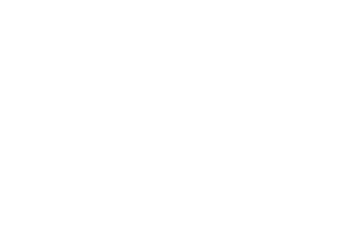

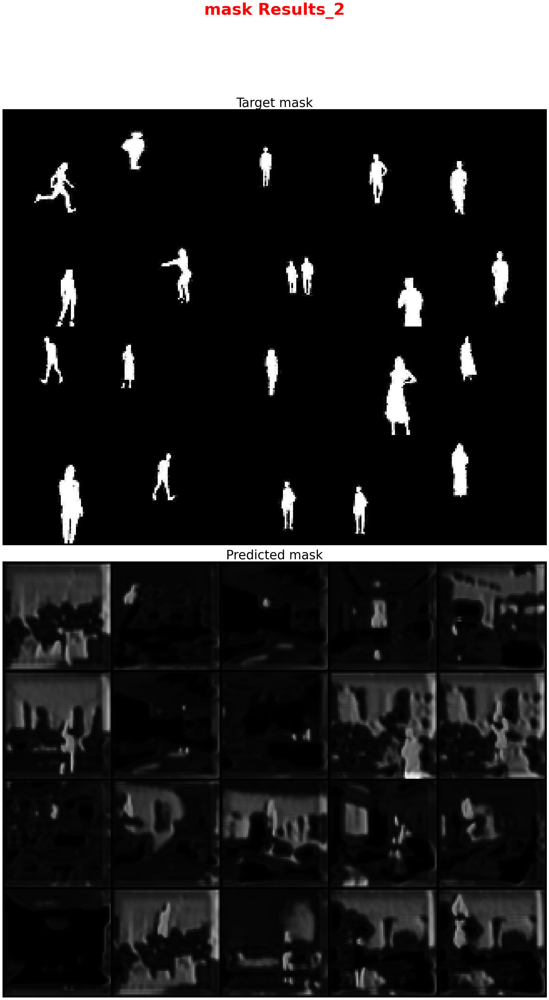

Results are saved in Results_2_ type.jpg


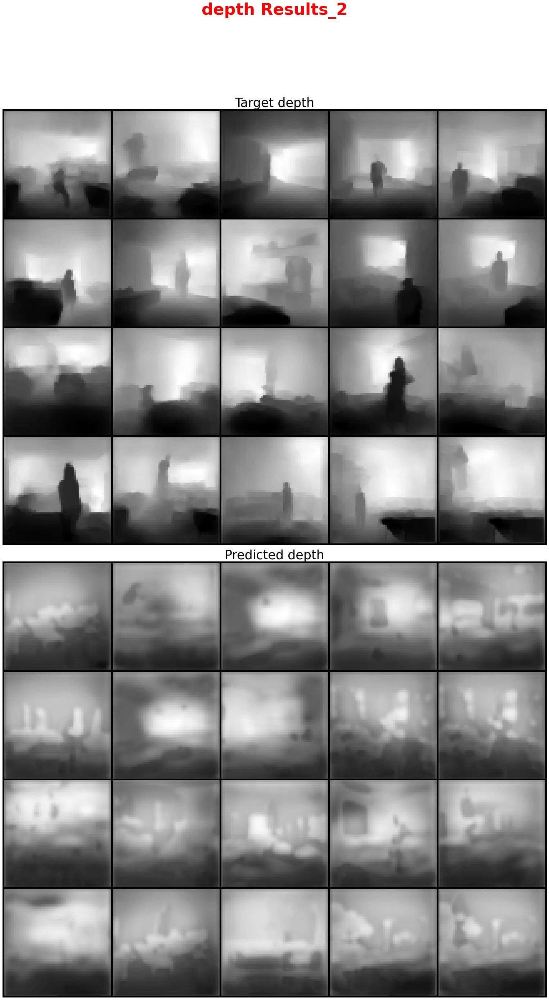

Results are saved in Results_2_ type.jpg


In [30]:
#ckpt_path='/content/model_office.pth'
#device = torch.device("cuda")
#model = smp.Unet("resnet18", encoder_weights=None, classes=1, activation=None)
#model.to(device)
#model.eval()
#state = torch.load(ckpt_path, map_location=lambda storage, loc: storage)
#model.load_state_dict(state["state_dict"])

# fig, a =plt.subplots(10,4,figsize=(15,25))

# fig.suptitle('predicted_mask//original_mask')
import matplotlib.pyplot as plt

  
import torch

def show_result_img(target, predict, type, name):
    
    fig, a =plt.subplots(2,1,figsize=(45,35))
    fig.suptitle(type +" "+ name,fontweight="bold",fontsize=45,y=1.1,color='r')
    
 
    target= target*255
    target = target.numpy()

    predict = predict*255
    predict = predict.numpy()

  
    plt.axis("off")
    a[0].imshow(target[0], cmap = "gray")
    a[1].imshow(predict[0], cmap = "gray")
   
    a[0].set_title('Target '+type,fontsize=35)
    a[1].set_title('Predicted ' +type,fontsize=35)

    a[0].axis("off")
    a[1].axis("off")

  
        
      
   
  
    plt.savefig(name+'_'+type+'.jpg')
    plt.tight_layout()
    plt.show()
    print(f"Results are saved in {name}_ {'type'}.jpg")

   
  

def show_results(model,testloader,name):
    batch = next(iter(testloader))
    images,mask_target,depth_target = batch
    mask, depth = model(images.to(device))

    batch_preds_mask = torch.sigmoid(mask)
    batch_preds_mask = batch_preds_mask.detach().cpu()
    
    batch_preds_depth = depth
    batch_preds_depth = batch_preds_depth.detach().cpu()


    plt.axis("off")
    m = torch.unsqueeze(mask_target, 1)
    d = torch.unsqueeze(depth_target, 1)
    images = []
    mask_target = []
    depth_target = []
    mask_pred = []
    depth_pred = []
    for i in range(20):
      mask_target.append(m[i])
      depth_target.append(d[i])
      mask_pred.append(batch_preds_mask[i])
      depth_pred.append(batch_preds_depth[i])
    mask_t = torchvision.utils.make_grid(mask_target,nrow=5,padding=1,scale_each=True)
    mask_p =torchvision.utils.make_grid(mask_pred,nrow=5,padding=1,scale_each=True)
    depth_t = torchvision.utils.make_grid(depth_target,nrow=5,padding=1,scale_each=True)
    depth_p = torchvision.utils.make_grid(depth_pred,nrow=5,padding=1,scale_each=True)
    show_result_img(mask_t,mask_p, "mask", name = name)
    show_result_img(depth_t,depth_p, "depth", name = name)
show_results(model,testloader,name = "Results_2")

     

In [0]:
#Extract data
import time
import os
import zipfile
if (os.path.isdir("data_2")):
    print ('Images already downloaded...')
else:
  start = time.time()
  archive = zipfile.ZipFile(f'/content/gdrive/My Drive/Mask_Rcnn/Dataset/data_part2.zip')
  archive.extractall()
  end = time.time()
  print(f"data set extraction took {round(end-start,2)}s")

data set extraction took 33.26s


In [0]:
import albumentations as A
import cv2
import time
fg_bg_means = (0.65830478, 0.61511271, 0.5740604,0.65830478, 0.61511271, 0.5740604)
fg_bg_stdevs = (0.24408717, 0.2542491, 0.26870159,0.24408717, 0.2542491, 0.26870159)
op_means = (0)
op_std = (255)

train_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                   
                                       ])
op_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=op_means, std=op_std),
                                      A.Transpose(always_apply=True),
                                
                                   
                                       ])

test_transform = AlbumentationTransforms([
                                          A.Resize(64,64),
                                          A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                        ])
train  = {
    'ip': train_transform,
    'op': op_transform
}
test = {
    'ip': test_transform,
    'op': op_transform
}
start = time.time()
train_dataset , test_dataset= RawDataSet(train_split = 70,test_transforms=test,train_transforms=train, set_no = 2,url_path ='/content/data_2')
end = time.time()
print(f'dataset formation took {round(end-start,3)} seconds')


80000
dataset formation took 0.217 seconds


In [0]:
trainloader, testloader = train_test_loader.load(train_dataset,test_dataset,batch_size=128)

sample train images took 1.608s to dispay


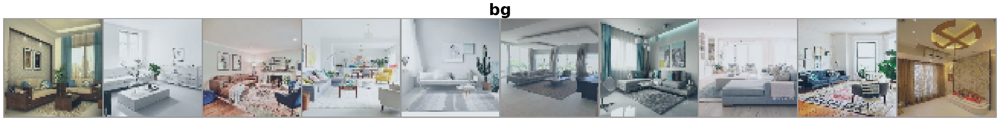

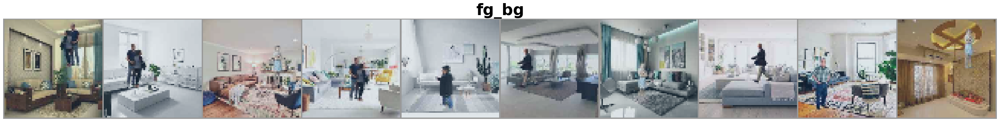

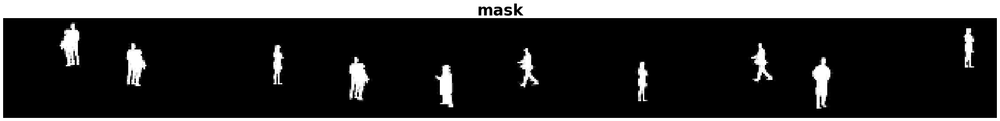

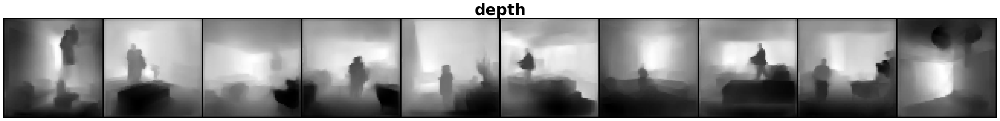

In [0]:
show_sample_data(trainloader)

In [0]:
model = UNet(n_channels = 6,n_classes = 1).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
checkpoint = torch.load("/content/gdrive/My Drive/S15-Checkpoints/checkpoint2.pt")
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

model.eval()
print("Loaded the best model")

Loaded the best model


In [0]:
import torchvision
from torch.utils.tensorboard import SummaryWriter
tb = SummaryWriter('runs/MODEST-2')
images, mask, depth = next(iter(trainloader))
images = images.to(device)

#tb.add_image('images', images)
tb.add_graph(model, images)
tb.close()

In [0]:
import os
logs_base_dir = "runs/MODEST-2"
os.makedirs(logs_base_dir, exist_ok=True)

In [0]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR,StepLR
optimizer = optim.Adam(model.parameters(),lr=0.01)
scheduler=optim.lr_scheduler.ReduceLROnPlateau(optimizer,patience=2, verbose=False)
#optimizer = optim.SGD(model.parameters(), lr=0.01,momentum=0.9,weight_decay = 0.0001,nesterov = True ) 
mask_criterion = nn.BCEWithLogitsLoss()
depth_criterion = nn.BCEWithLogitsLoss()
#scheduler = OneCycleLR(optimizer, max_lr = 0.02, total_steps=None, epochs=10, steps_per_epoch=len(trainloader), pct_start=1/3, anneal_strategy='linear', cycle_momentum=True, base_momentum=0.85, max_momentum=0.95, div_factor=10.0,final_div_factor =10)

In [0]:
train_model(model,device,trainloader,testloader,optimizer,mask_criterion,depth_criterion,10,scheduler,batch_scheduler=False,best_loss = 0.0077,path = "/content/gdrive/My Drive/S15-Checkpoints/checkpoint2.pt")

EPOCH: 1 LR: 0.01




Train set: Average loss: 0.0075, Coef: (0.00289)





Test set: Average loss: 0.0076, Coef: (0.00300)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 2 LR: 0.01




Train set: Average loss: 0.0077, Coef: (0.00303)





Test set: Average loss: 0.0076, Coef: (0.00303)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 3 LR: 0.01




Train set: Average loss: 0.0079, Coef: (0.00300)





Test set: Average loss: 0.0076, Coef: (0.00252)

----------------------------------------------------------------------------------
EPOCH: 4 LR: 0.01




Train set: Average loss: 0.0076, Coef: (0.00297)





Test set: Average loss: 0.0076, Coef: (0.00295)

----------------------------------------------------------------------------------
EPOCH: 5 LR: 0.01




Train set: Average loss: 0.0075, Coef: (0.00303)





Test set: Average loss: 0.0076, Coef: (0.00308)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 6 LR: 0.01




Train set: Average loss: 0.0075, Coef: (0.00305)





Test set: Average loss: 0.0076, Coef: (0.00305)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 7 LR: 0.01




Train set: Average loss: 0.0075, Coef: (0.00306)





Test set: Average loss: 0.0076, Coef: (0.00309)

----------------------------------------------------------------------------------
EPOCH: 8 LR: 0.01




Train set: Average loss: 0.0073, Coef: (0.00307)





Test set: Average loss: 0.0076, Coef: (0.00304)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 9 LR: 0.01




Train set: Average loss: 0.0079, Coef: (0.00307)





Test set: Average loss: 0.0076, Coef: (0.00310)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 10 LR: 0.01




Train set: Average loss: 0.0077, Coef: (0.00307)





Test set: Average loss: 0.0076, Coef: (0.00305)

----------------------------------------------------------------------------------
Traning took 2332.3s for 10 epochs


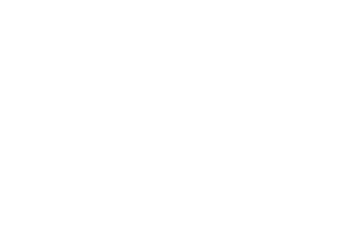

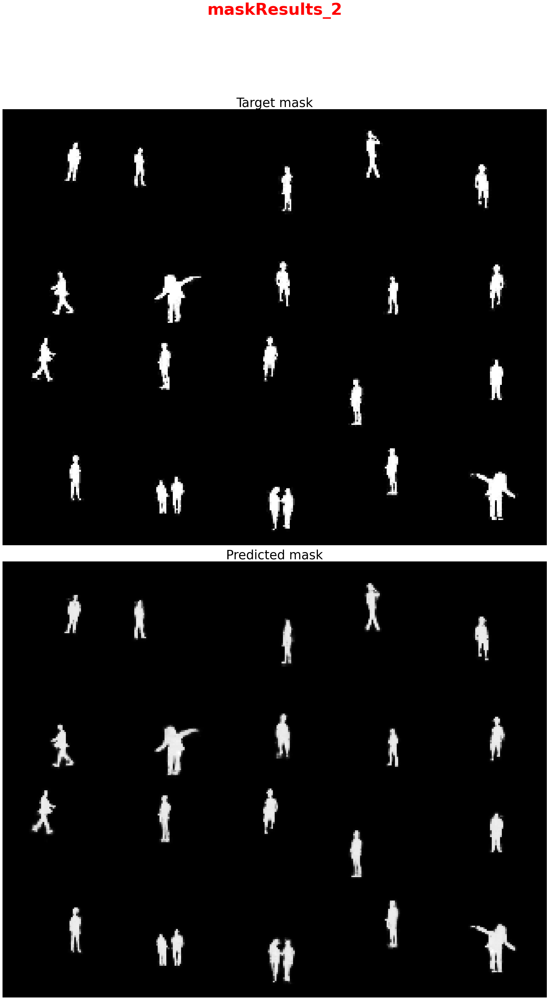

Results are saved in Results_2_ type.jpg


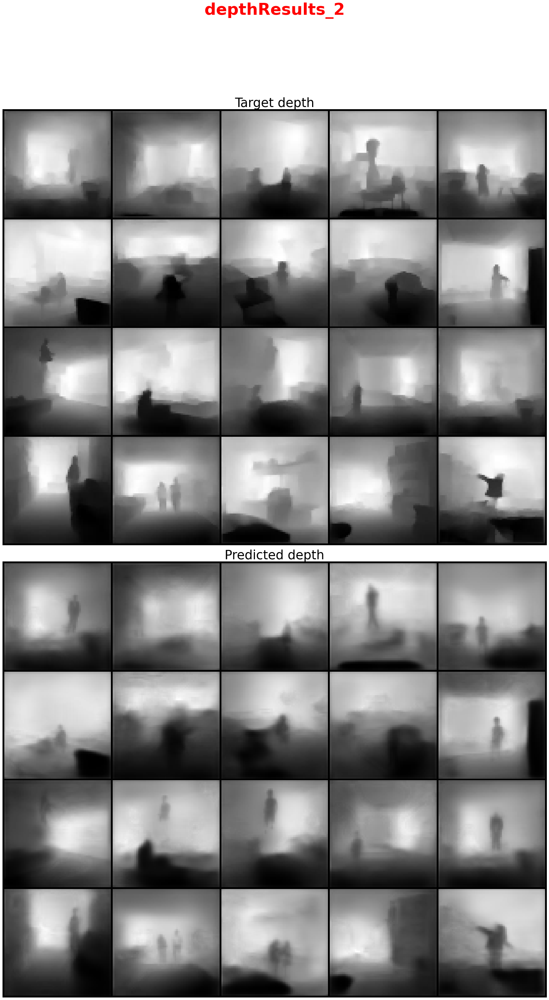

Results are saved in Results_2_ type.jpg


In [0]:
show_results(model,testloader, name = "Results_2")

In [0]:
#Extract data
import time
import os
import zipfile
if (os.path.isdir("data_3")):
    print ('Images already downloaded...')
else:
  start = time.time()
  archive = zipfile.ZipFile(f'/content/gdrive/My Drive/Mask_Rcnn/Dataset/data_part3.zip')
  archive.extractall()
  end = time.time()
  print(f"data set extraction took {round(end-start,2)}s")

data set extraction took 46.38s


In [0]:
import albumentations as A
import cv2
import time
fg_bg_means = (0.65830478, 0.61511271, 0.5740604,0.65830478, 0.61511271, 0.5740604)
fg_bg_stdevs = (0.24408717, 0.2542491, 0.26870159,0.24408717, 0.2542491, 0.26870159)
op_means = (0)
op_std = (255)

train_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                   
                                       ])
op_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=op_means, std=op_std),
                                      A.Transpose(always_apply=True),
                                
                                   
                                       ])

test_transform = AlbumentationTransforms([
                                          A.Resize(64,64),
                                          A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                        ])
train  = {
    'ip': train_transform,
    'op': op_transform
}
test = {
    'ip': test_transform,
    'op': op_transform
}
start = time.time()
train_dataset , test_dataset= RawDataSet(train_split = 70,test_transforms=test,train_transforms=train, set_no = 3,url_path ='/content/data_3')
end = time.time()
print(f'dataset formation took {round(end-start,3)} seconds')


80000
dataset formation took 0.233 seconds


In [0]:
trainloader, testloader = train_test_loader.load(train_dataset,test_dataset,batch_size=128)

sample train images took 11.431s to dispay


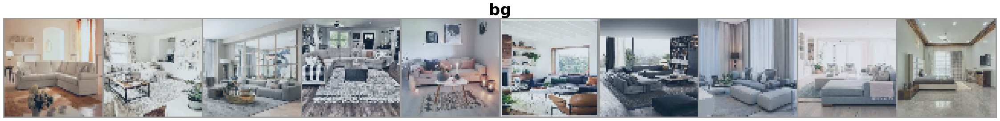

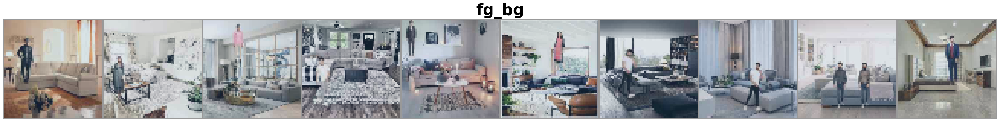

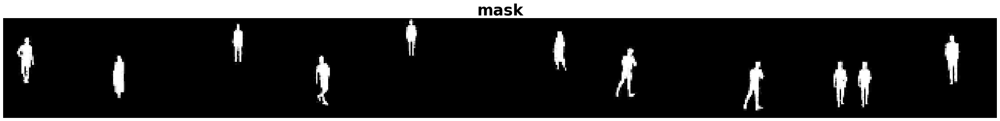

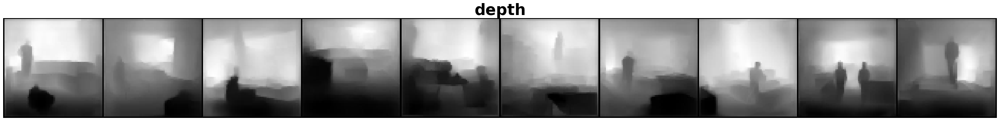

In [0]:
show_sample_data(trainloader)

In [0]:
model = UNet(n_channels = 6,n_classes = 1).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
checkpoint = torch.load("/content/gdrive/My Drive/S15-Checkpoints/checkpoint2.pt")
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

model.eval()
print("Loaded the best model")

Loaded the best model


In [0]:
import torchvision
from torch.utils.tensorboard import SummaryWriter
tb = SummaryWriter('runs/MODEST-3')
images, mask, depth = next(iter(trainloader))
images = images.to(device)

#tb.add_image('images', images)
tb.add_graph(model, images)
tb.close()

In [0]:
import os
logs_base_dir = "runs/MODEST-3"
os.makedirs(logs_base_dir, exist_ok=True)

In [0]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR,StepLR

scheduler=optim.lr_scheduler.StepLR(optimizer,step_size = 4, gamma=0.1)

mask_criterion = nn.BCEWithLogitsLoss()
depth_criterion = nn.BCEWithLogitsLoss()


In [0]:
train_model(model,device,trainloader,testloader,optimizer,mask_criterion,depth_criterion,10,scheduler,batch_scheduler=False,best_loss = 0.0076,path = "/content/gdrive/My Drive/S15-Checkpoints/checkpoint3.pt")

EPOCH: 1 LR: 0.01




Train set: Average loss: 0.0075, Coef: (0.00307)





Test set: Average loss: 0.0076, Coef: (0.00309)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 2 LR: 0.01




Train set: Average loss: 0.0074, Coef: (0.00303)





Test set: Average loss: 0.0076, Coef: (0.00284)

----------------------------------------------------------------------------------
EPOCH: 3 LR: 0.01




Train set: Average loss: 0.0075, Coef: (0.00302)





Test set: Average loss: 0.0076, Coef: (0.00305)

----------------------------------------------------------------------------------
EPOCH: 4 LR: 0.01




Train set: Average loss: 0.0078, Coef: (0.00306)





Test set: Average loss: 0.0076, Coef: (0.00307)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 5 LR: 0.001




Train set: Average loss: 0.0078, Coef: (0.00307)





Test set: Average loss: 0.0076, Coef: (0.00306)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 6 LR: 0.001




Train set: Average loss: 0.0077, Coef: (0.00307)





Test set: Average loss: 0.0076, Coef: (0.00309)

----------------------------------------------------------------------------------
EPOCH: 7 LR: 0.001




Train set: Average loss: 0.0076, Coef: (0.00307)





Test set: Average loss: 0.0076, Coef: (0.00307)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 8 LR: 0.001




Train set: Average loss: 0.0075, Coef: (0.00307)





Test set: Average loss: 0.0076, Coef: (0.00308)

----------------------------------------------------------------------------------
EPOCH: 9 LR: 0.0001




Train set: Average loss: 0.0075, Coef: (0.00308)





Test set: Average loss: 0.0076, Coef: (0.00308)

loss reduced, Saving model....
----------------------------------------------------------------------------------
EPOCH: 10 LR: 0.0001




Train set: Average loss: 0.0076, Coef: (0.00308)





Test set: Average loss: 0.0076, Coef: (0.00307)

----------------------------------------------------------------------------------
Traning took 2853.316s for 10 epochs


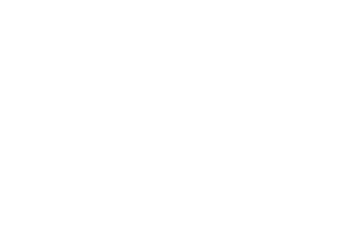

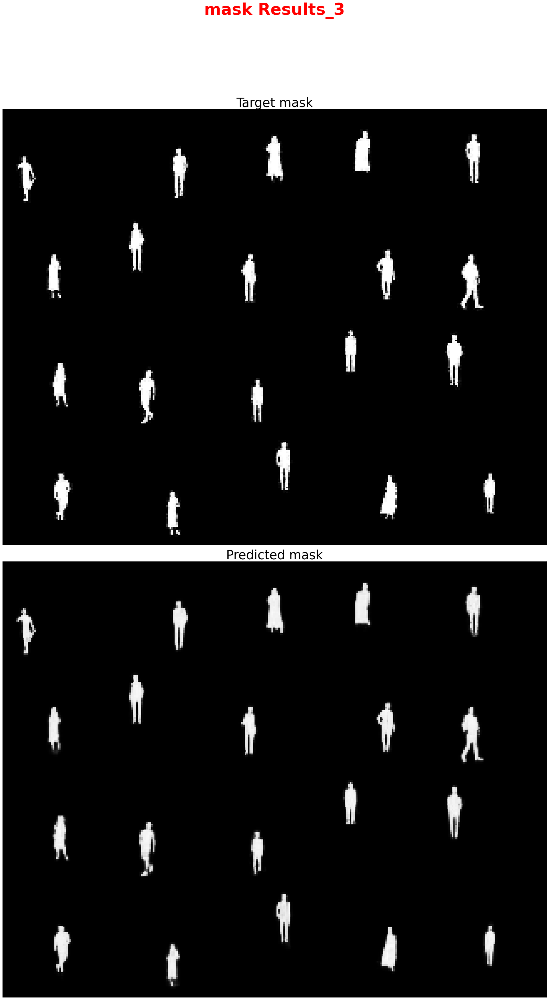

Results are saved in Results_3_ type.jpg


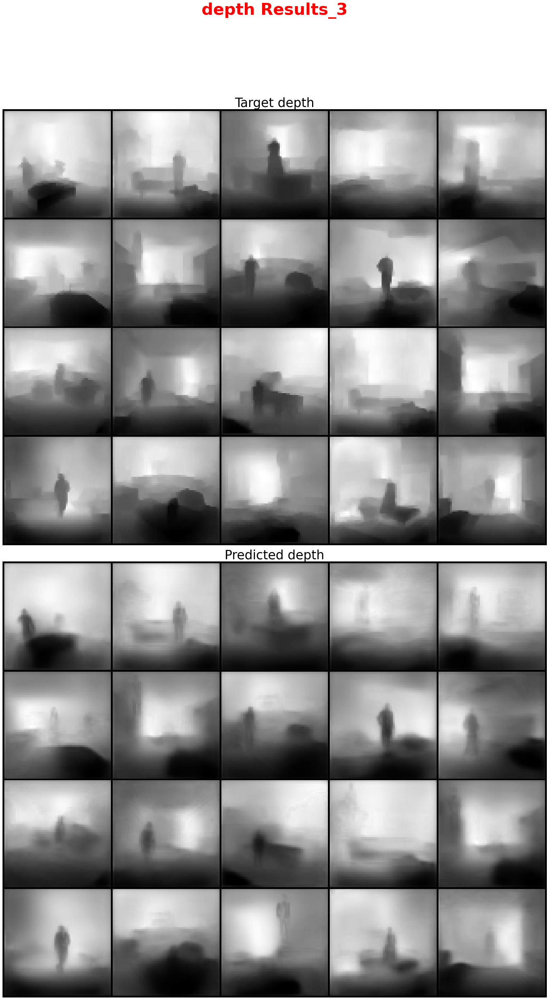

Results are saved in Results_3_ type.jpg


In [0]:
show_results(model,testloader, name = "Results_3")

In [0]:
#Extract data
import time
import os
import zipfile
if (os.path.isdir("data_4")):
    print ('Images already downloaded...')
else:
  start = time.time()
  archive = zipfile.ZipFile(f'/content/gdrive/My Drive/Mask_Rcnn/Dataset/data_part4.zip')
  archive.extractall()
  end = time.time()
  print(f"data set extraction took {round(end-start,2)}s")

data set extraction took 44.65s


In [0]:
import albumentations as A
import cv2
import time
fg_bg_means = (0.65830478, 0.61511271, 0.5740604,0.65830478, 0.61511271, 0.5740604)
fg_bg_stdevs = (0.24408717, 0.2542491, 0.26870159,0.24408717, 0.2542491, 0.26870159)
op_means = (0)
op_std = (255)

train_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                   
                                       ])
op_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=op_means, std=op_std),
                                      A.Transpose(always_apply=True),
                                
                                   
                                       ])

test_transform = AlbumentationTransforms([
                                          A.Resize(64,64),
                                          A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                        ])
train  = {
    'ip': train_transform,
    'op': op_transform
}
test = {
    'ip': test_transform,
    'op': op_transform
}
start = time.time()
train_dataset , test_dataset= RawDataSet(train_split = 70,test_transforms=test,train_transforms=train, set_no = 4,url_path ='/content/data_4')
end = time.time()
print(f'dataset formation took {round(end-start,3)} seconds')


80000
dataset formation took 0.228 seconds


In [0]:
trainloader, testloader = train_test_loader.load(train_dataset,test_dataset,batch_size=128)

sample train images took 1.879s to dispay


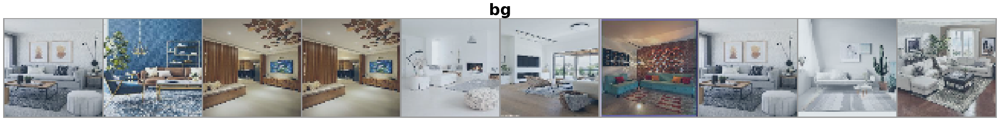

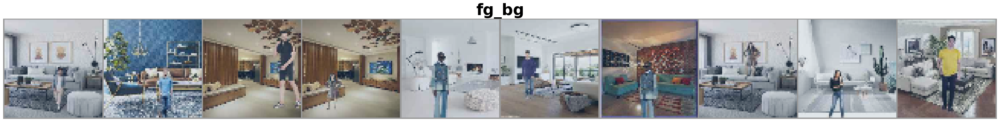

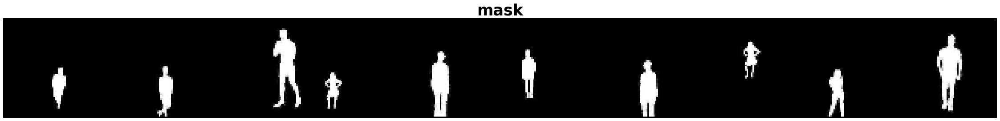

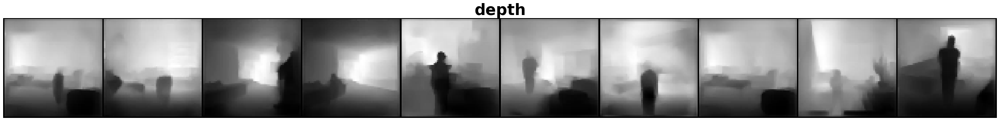

In [0]:
show_sample_data(trainloader)

In [0]:
model = UNet(n_channels = 6,n_classes = 1).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
checkpoint = torch.load("/content/gdrive/My Drive/S15-Checkpoints/checkpoint3.pt")
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

model.eval()
print("Loaded the best model")

Loaded the best model


In [0]:
import torchvision
from torch.utils.tensorboard import SummaryWriter
tb = SummaryWriter('runs/MODEST-4')
images, mask, depth = next(iter(trainloader))
images = images.to(device)

#tb.add_image('images', images)
tb.add_graph(model, images)
tb.close()

In [0]:
import os
logs_base_dir = "runs/MODEST"
os.makedirs(logs_base_dir, exist_ok=True)

In [0]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR,StepLR

scheduler=optim.lr_scheduler.StepLR(optimizer,step_size = 4, gamma=0.1)

mask_criterion = nn.BCEWithLogitsLoss()
depth_criterion = nn.BCEWithLogitsLoss()


In [0]:
train_model(model,device,trainloader,testloader,optimizer,mask_criterion,depth_criterion,10,scheduler,batch_scheduler=False,best_loss = 0.0076,path = "/content/gdrive/My Drive/S15-Checkpoints/checkpoint4.pt")

EPOCH: 1 LR: 0.0001




Train set: Average loss: 0.0077, Coef: (0.00306)





Test set: Average loss: 0.0077, Coef: (0.00307)

----------------------------------------------------------------------------------
EPOCH: 2 LR: 0.0001




Train set: Average loss: 0.0078, Coef: (0.00307)





Test set: Average loss: 0.0077, Coef: (0.00307)

----------------------------------------------------------------------------------
EPOCH: 3 LR: 0.0001




Train set: Average loss: 0.0077, Coef: (0.00307)





Test set: Average loss: 0.0077, Coef: (0.00306)

----------------------------------------------------------------------------------
EPOCH: 4 LR: 0.0001




Train set: Average loss: 0.0076, Coef: (0.00307)





Test set: Average loss: 0.0077, Coef: (0.00307)

----------------------------------------------------------------------------------
EPOCH: 5 LR: 1e-05




Train set: Average loss: 0.0079, Coef: (0.00307)





Test set: Average loss: 0.0077, Coef: (0.00307)

----------------------------------------------------------------------------------
EPOCH: 6 LR: 1e-05




Train set: Average loss: 0.0076, Coef: (0.00307)





Test set: Average loss: 0.0077, Coef: (0.00307)

----------------------------------------------------------------------------------
EPOCH: 7 LR: 1e-05




Train set: Average loss: 0.0078, Coef: (0.00307)





Test set: Average loss: 0.0077, Coef: (0.00308)

----------------------------------------------------------------------------------
EPOCH: 8 LR: 1e-05




Train set: Average loss: 0.0076, Coef: (0.00307)





Test set: Average loss: 0.0077, Coef: (0.00307)

----------------------------------------------------------------------------------
EPOCH: 9 LR: 1.0000000000000002e-06




Train set: Average loss: 0.0078, Coef: (0.00307)





Test set: Average loss: 0.0077, Coef: (0.00307)

----------------------------------------------------------------------------------
EPOCH: 10 LR: 1.0000000000000002e-06




Train set: Average loss: 0.0077, Coef: (0.00307)



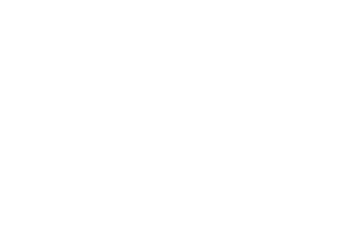

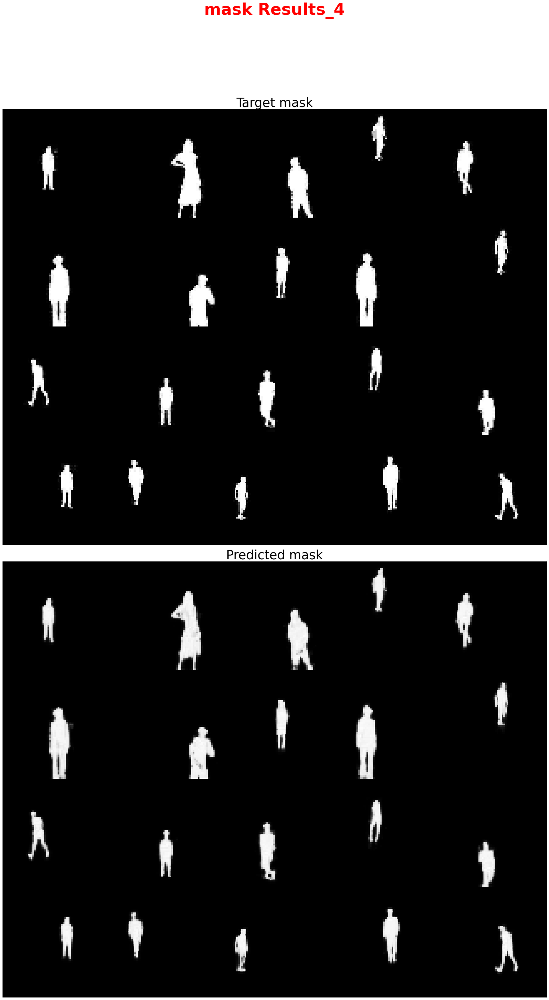

Results are saved in Results_4_ type.jpg


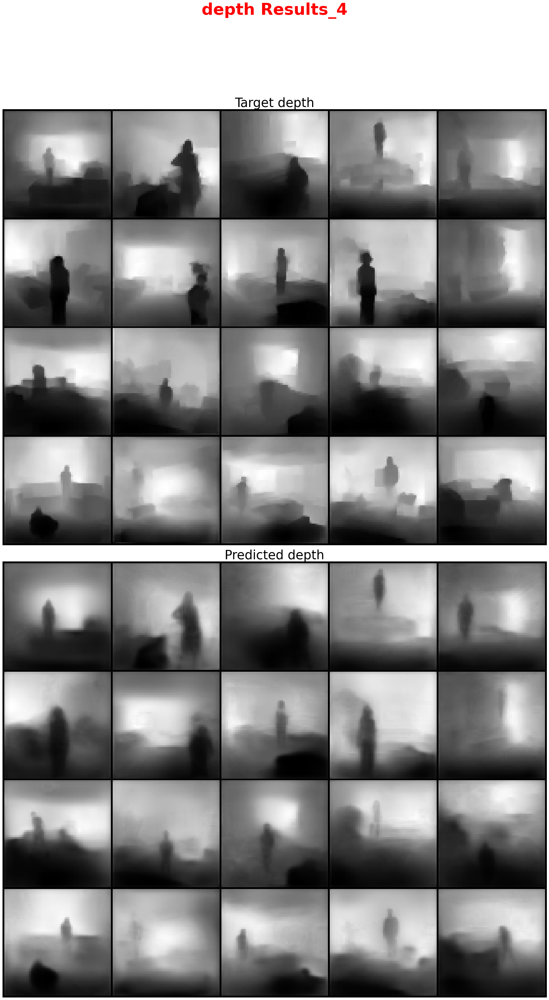

Results are saved in Results_4_ type.jpg


In [0]:
show_results(model,testloader, name = "Results_4")

In [0]:
#Extract data
import time
import os
import zipfile
if (os.path.isdir("data_5")):
    print ('Images already downloaded...')
else:
  start = time.time()
  archive = zipfile.ZipFile(f'/content/gdrive/My Drive/Mask_Rcnn/Dataset/data_part5.zip')
  archive.extractall()
  end = time.time()
  print(f"data set extraction took {round(end-start,2)}s")

data set extraction took 46.7s


In [0]:
!ls /content/data_5/Fg-Bg

In [0]:
import albumentations as A
import cv2
import time
fg_bg_means = (0.65830478, 0.61511271, 0.5740604,0.65830478, 0.61511271, 0.5740604)
fg_bg_stdevs = (0.24408717, 0.2542491, 0.26870159,0.24408717, 0.2542491, 0.26870159)
op_means = (0)
op_std = (255)

train_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                   
                                       ])
op_transform = AlbumentationTransforms([       
                                                                
                             
                                      A.Resize(64,64),
                                      A.Normalize(mean=op_means, std=op_std),
                                      A.Transpose(always_apply=True),
                                
                                   
                                       ])

test_transform = AlbumentationTransforms([
                                          A.Resize(64,64),
                                          A.Normalize(mean=fg_bg_means, std=fg_bg_stdevs),
                                        ])
train  = {
    'ip': train_transform,
    'op': op_transform
}
test = {
    'ip': test_transform,
    'op': op_transform
}
start = time.time()
train_dataset , test_dataset= RawDataSet(train_split = 70,test_transforms=test,train_transforms=train, set_no = 5,url_path ='/content/data_5')
end = time.time()
print(f'dataset formation took {round(end-start,3)} seconds')

In [0]:
trainloader, testloader = train_test_loader.load(train_dataset,test_dataset,batch_size=128)

In [0]:
show_sample_data(trainloader)

In [29]:
model = UNet(n_channels = 6,n_classes = 1).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.01)
checkpoint = torch.load("/content/gdrive/My Drive/S15-Checkpoints/checkpoint2.pt")
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

model.eval()
print("Loaded the best model")

Loaded the best model


In [0]:
import torchvision
from torch.utils.tensorboard import SummaryWriter
tb = SummaryWriter('runs/MODEST-5')
images, mask, depth = next(iter(trainloader))
images = images.to(device)

#tb.add_image('images', images)
tb.add_graph(model, images)
tb.close()

In [0]:
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR,StepLR

scheduler=optim.lr_scheduler.StepLR(optimizer,step_size = 4, gamma=0.1)

mask_criterion = nn.BCEWithLogitsLoss()
depth_criterion = nn.BCEWithLogitsLoss()


In [0]:
train_model(model,device,trainloader,testloader,optimizer,mask_criterion,depth_criterion,10,scheduler,batch_scheduler=False,best_loss = 0.0076,path = "/content/gdrive/My Drive/S15-Checkpoints/checkpoint5.pt")

In [0]:
show_results(model,testloader, name = "Results_5")